## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [26]:
!nvidia-smi

Mon Jul  8 14:47:23 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P8               9W /  70W |      3MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [27]:
import os
HOME = os.getcwd()
print(HOME)

/content


## Install YOLOv8

⚠️ YOLOv8 is still under heavy development. Breaking changes are being introduced almost weekly. We strive to make our YOLOv8 notebooks work with the latest version of the library. Last tests took place on **18.01.2023** with version **YOLOv8.0.9**.

If you notice that our notebook behaves incorrectly - especially if you experience errors that prevent you from going through the tutorial - don't hesitate! Let us know and open an [issue](https://github.com/roboflow/notebooks/issues) on the Roboflow Notebooks repository.

YOLOv8 can be installed in two ways - from the source and via pip. This is because it is the first iteration of YOLO to have an official package.

In [28]:
# Pip install method (recommended)

!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.3/78.2 GB disk)


In [4]:
from ultralytics import YOLO

from IPython.display import display, Image

## CLI Basics

## Inference with Pre-trained COCO Model

### 💻 CLI

`yolo mode=predict` runs YOLOv8 inference on a variety of sources, downloading models automatically from the latest YOLOv8 release, and saving results to `runs/predict`.

In [29]:
%cd {HOME}
!yolo task=segment mode=predict model=yolov8s-seg.pt conf=0.25 source='https://media.roboflow.com/notebooks/examples/dog.jpeg'

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11810560 parameters, 0 gradients, 42.6 GFLOPs

Found https://media.roboflow.com/notebooks/examples/dog.jpeg locally at dog.jpeg
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
image 1/1 /content/dog.jpeg: 640x384 1 person, 1 car, 1 dog, 1 backpack, 1 handbag, 125.8ms
Speed: 2.1ms preprocess, 125.8ms inference, 564.7ms postprocess per image at shape (1, 3, 640, 384)
Results saved to runs/segment/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


/content


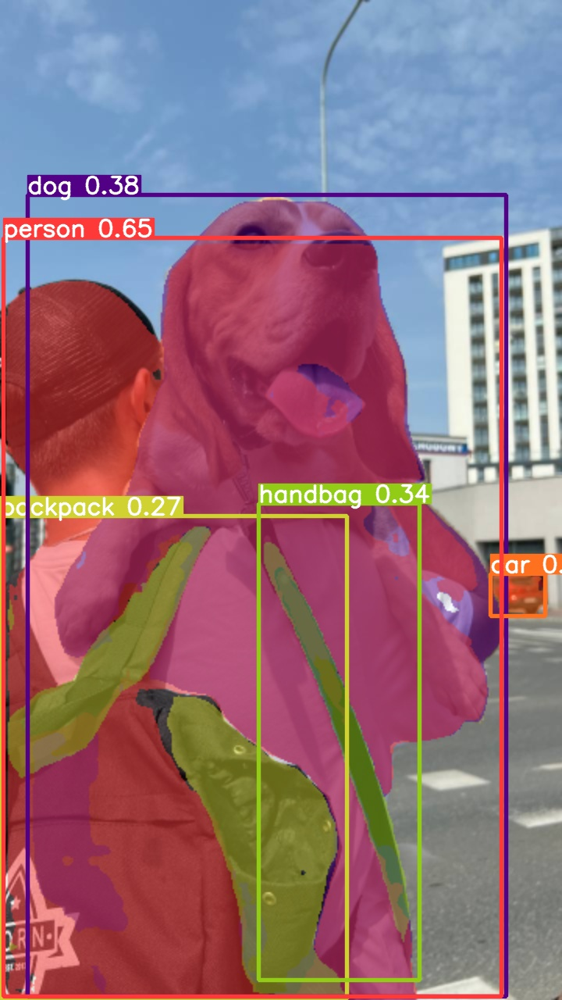

In [30]:
%cd {HOME}
Image(filename='runs/segment/predict/dog.jpeg', height=600)

### 🐍 Python SDK

The simplest way of simply using YOLOv8 directly in a Python environment.

In [32]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow --quiet

from roboflow import Roboflow
rf = Roboflow(api_key="dk6uaKPPKdbGTxDxPvWm")
project = rf.workspace("rdd-2nojt").project("pothole-h3yzb")
version = project.version(2)
dataset = version.download("yolov8")

mkdir: cannot create directory ‘/content/datasets’: File exists
/content/datasets
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to pothole-2 in yolov8:: 100%|██████████| 58/58 [00:00<00:00, 7153.52it/s]


## Custom Training

In [33]:
%cd {HOME}

!yolo task=segment mode=train model=yolov8s-seg.pt data={dataset.location}/data.yaml epochs=10 imgsz=640

/content
New https://pypi.org/project/ultralytics/8.2.51 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8s-seg.pt, data=/content/datasets/pothole-2/data.yaml, epochs=10, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=

In [35]:
pip install cvzone

  Preparing metadata (setup.py) ... done
  Created wheel for cvzone: filename=cvzone-1.6.1-py3-none-any.whl size=26297 sha256=777f5ab9e69ce95466ffcd87b23360438099b8e813d8c5b25817bd9d38888489
  Stored in directory: /root/.cache/pip/wheels/2c/9f/b3/92e945ac4a71bf727a92463f38155cc5a4fa49c5010b38ec4c
Successfully built cvzone


In [40]:
from ultralytics import YOLO
import cv2
import numpy as np

# Load a model
model = YOLO("/content/runs/segment/train15/weights/best.pt")
class_names = model.names
cap = cv2.VideoCapture('/content/istockphoto-937868038-640_adpp_is.mp4')
count = 0

# Define codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('/content/processed_video.mp4', fourcc, 20.0, (1020, 500))

while True:
    ret, img = cap.read()
    if not ret:
        break
    count += 1
    if count % 3 != 0:
        continue

    img = cv2.resize(img, (1020, 500))
    h, w, _ = img.shape
    results = model.predict(img)

    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs

    if masks is not None:
        masks = masks.data.cpu()
        for seg, box in zip(masks.data.cpu().numpy(), boxes):
            seg = cv2.resize(seg, (w, h))
            contours, _ = cv2.findContours((seg).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

            for contour in contours:
                d = int(box.cls)
                c = class_names[d]
                x, y, x1, y1 = cv2.boundingRect(contour)
                cv2.polylines(img, [contour], True, color=(0, 0, 255), thickness=2)
                # cv2.rectangle(img, (x, y), (x1 + x, y1 + y), (255, 0, 0), 2)
                cv2.putText(img, c, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

    out.write(img)  # Write the frame to the video file

cap.release()
out.release()
cv2.destroyAllWindows()



0: 320x640 2 potholes, 14.3ms
Speed: 2.9ms preprocess, 14.3ms inference, 3.1ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 1 pothole, 16.3ms
Speed: 2.4ms preprocess, 16.3ms inference, 3.0ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 (no detections), 13.2ms
Speed: 3.0ms preprocess, 13.2ms inference, 0.6ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 2 potholes, 16.9ms
Speed: 3.3ms preprocess, 16.9ms inference, 6.3ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 (no detections), 16.9ms
Speed: 3.6ms preprocess, 16.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 1 pothole, 14.8ms
Speed: 2.3ms preprocess, 14.8ms inference, 3.2ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 2 potholes, 16.2ms
Speed: 4.4ms preprocess, 16.2ms inference, 3.2ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 3 potholes, 13.4ms
Speed: 2.4ms preprocess, 13.4ms inference, 3.1ms postprocess per 

In [41]:
from IPython.display import Video

# Display the processed video
Video('/content/processed_video.mp4', embed=True)


In [39]:
from ultralytics import YOLO
import cv2
import numpy as np
import cvzone

# Load a model
model = YOLO("/content/runs/segment/train15/weights/best.pt")
class_names = model.names
cap = cv2.VideoCapture('/content/istockphoto-937868038-640_adpp_is.mp4')
count = 0

while True:
    ret, img = cap.read()
    if not ret:
        break
    count += 1
    if count % 3 != 0:
        continue

    img = cv2.resize(img, (1020, 500))
    h, w, _ = img.shape
    results = model.predict(img)

    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs

    if masks is not None:
        masks = masks.data.cpu()
        for seg, box in zip(masks.data.cpu().numpy(), boxes):
            seg = cv2.resize(seg, (w, h))
            contours, _ = cv2.findContours((seg).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

            for contour in contours:
                d = int(box.cls)
                c = class_names[d]
                x, y,x1,y1 = cv2.boundingRect(contour)
                cv2.polylines(img, [contour],True, color=(0, 0, 255), thickness=2)
#                cv2.rectangle(img,(x,y),(x1+x,y1+y),(255,0,0),2)
                cv2.putText(img, c, (x,y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

    # cv2.imshow('img', img)
    # if cv2.waitKey(0) & 0xFF == ord('q'):
    #     break

cap.release()
cv2.destroyAllWindows()




0: 320x640 2 potholes, 14.4ms
Speed: 2.3ms preprocess, 14.4ms inference, 3.0ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 1 pothole, 13.4ms
Speed: 2.3ms preprocess, 13.4ms inference, 3.3ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 (no detections), 13.9ms
Speed: 2.3ms preprocess, 13.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 2 potholes, 13.1ms
Speed: 2.1ms preprocess, 13.1ms inference, 2.0ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 (no detections), 13.1ms
Speed: 2.4ms preprocess, 13.1ms inference, 0.5ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 1 pothole, 13.1ms
Speed: 1.9ms preprocess, 13.1ms inference, 2.1ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 2 potholes, 13.1ms
Speed: 2.2ms preprocess, 13.1ms inference, 1.9ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 3 potholes, 13.2ms
Speed: 2.2ms preprocess, 13.2ms inference, 3.7ms postprocess per 